# FIT3081 Image Processing- Assignment 2 (S1, 2023)

<div style="text-align: left"> <h3> Student 1: Kuah Jia Chen, 32286988  </h3>  </div>
<div style="text-align: left"> <h3> Student 2: Samuel Tai Meng Yao, 32025068  </h3>  </div>

<hr style="height:3px;border-width:0;color:gray;background-color:gray">

# Overview
This Jupyter Notebook contains three main sections. The first section includes manual code for implementing various image preprocessing methods. The second section aims to locate the number plate using horizontal and vertical projections, but the low accuracy of this approach made it unsuitable for use. In the third section, two subsections demonstrate different approaches to car license plate detection. The first subsection utilizes a customized Canny edge detection algorithm based on the code from the first section. However, the results were not satisfactory. The second subsection uses the built-in Canny edge detection algorithm and resulted in the most accurate and reliable implementation. Therefore, we have chosen the second approach as our final implementation and recommend the marker to disregard the performance of the first subsection. Both the approaches are included in the notebook for illustration purposes.

# Outline

1. Overview
2. Import Libraries
3. Section 1: Image Preprocessing
   * Image Rotation
   * Convert to gray scale
   * Image Resize
   * Contrast Stretching
   * Adjust Brightness
   * Histogram Equalization
   * Median Blur
   * Smoothing Filter (Gaussian Filter)
   * Edge Detection (Canny)
4. Section 2: Locate car license plate
   * Horizontal Projection
   * Vertical Projection
   * Find Possible Contours
   * HDV
5. Section 3.1: Car License Plate Detection Using a Customized Canny Edge Detection Algorithm
    * Dataset 1
    * Dataset 2
    * Dataset 3
    * Accuracy table
6. Section 3.2: Car License Plate Detection Using Built-in Canny Edge Detection Algorithm
    * Dataset 1
    * Dataset 2
    * Dataset 3
    * Accuracy table
7. Conclusion

# Import Libraries

In [1]:
# Import Libraries
import numpy as np
from PIL import Image, ImageChops, ImageOps
import cv2
import matplotlib.pyplot as plt
import math
from scipy.signal import convolve2d
from copy import deepcopy
import imutils
import os

# Section 1: Image Pre-processing

### Image Rotation

In [2]:
def rotate_img(img):
    """
    Purpose of the function: check the orientation metadata of an image and rotate it if necessary to make it upright
    """
    exifdata = img.getexif()   # get the metadata of the image (in our case .jpg img)

    if exifdata:
        orientation = exifdata.get(274, 1)   # Get the detail of the orientation metadata
        # Rotate the image if necessary
        if orientation in [3, 6, 8]:
            if orientation == 3:
                img = img.rotate(180, expand=True)
            elif orientation == 6:
                img = img.rotate(270, expand=True)
            elif orientation == 8:
                img = img.rotate(90, expand=True)
                
    return img

### Convert to gray scale

In [3]:
def convert_to_gray_scale(img):
    """
    Purpose of the function: convert a given image into grayscale
    """
    ## Using the given formula
    # Split into 3 channels
    r, g, b = img.split()
    # Reds * 0.2989
    r = r.point(lambda i: i * 0.2989)
    # Greens * 0.5870
    g = g.point(lambda i: i * 0.5870)
    # Blue * 0.1140
    b = b.point(lambda i: i * 0.1140)
    # Sum them up to get Grayscale Value
    result_img = ImageChops.add(r, ImageChops.add(g, b))
    # Display Image
    return result_img

### Image Resize

In [4]:
def resize_image(img, width, height):
    """
    Purpose of the function: resize the image to a specific width and height
    """
    result_img = img.resize((width, height))
    return result_img

### Contrast Stretching

In [5]:
def contrast_stretching(img):
    """
    Purpose of the function: perform contrast stretching on an input image to enhance its contrast
    """
    img = np.array(img)
    min_percent = 5 # Low percentile
    max_percent = 95 # High percentile
    c, d = np.percentile(img, (min_percent, max_percent)) # gives 5th and 95th percentiles
    a, b = 0, 255
    # Apply the stretch formula
    res_img = (img.astype(float) - c) * ((b-a)/(d-c)) + a
    #clamp range to [0, 255] and convert to uint8
    res_img = np.maximum(np.minimum(res_img, 255), 0).astype(np.uint8)
    #Display images before and after linear "stretch":
    res_img = Image.fromarray(res_img)
    return res_img

### Adjust Brightness

In [6]:
def adjusting_brightness(img):
    """
    Purpose of the function: adjusts the brightness of an image using a given alpha and beta value
    """
    img = np.array(img)
    aplha = 0.8
    beta = 70
    new_image = aplha * img + beta
    res_img = Image.fromarray(new_image)
    return res_img

### Histogram Equalization

In [7]:
def histogram_equalization(img):
    
    """
    Purpose of the function: perform histogram equalization on an input image to improve its contrast 
    and overall image quality
    """
    
    grey_hist = img.histogram()
    
    k = [i for i in range(len(grey_hist))]
    
    nk = [grey_hist[k[i]] for i in range(len(k))]
    
    sum_pixel = sum(grey_hist[:])
    intensity = len(grey_hist) - 1
    
    P_rk = [nk[i]/sum_pixel for i in range(len(k))]
    
    s_k = []
    for i in range(len(k)):
        if i == 0:
            s_k.append(P_rk[i])
        else:
            s_k.append(P_rk[i]+s_k[i - 1])
    
    sk_m = [s_k[i] * intensity for i in range(len(s_k))]
    
    new_gray_value = [round(sk_m[i]) for i in range(len(sk_m))]
    
    new_img_hist = [0] * 256
    for i in range(len(grey_hist)):
        current_num_pixel = grey_hist[i] 
        new_img_hist[new_gray_value[i]] += current_num_pixel
    
    img_array = np.array(img)
    for i in range(len(img_array)):
        for j in range(len(img_array[0])):
            current_index = img_array[i][j]
            new_value = new_gray_value[current_index]
            img_array[i][j] = new_value
        
    new_img = Image.fromarray(img_array)

    return new_img

### Median Blur

We manually implemented the median blur function, which is a common technique used in image processing to remove noise and improve image quality. However, after testing it on our number plate detection system, we found that it takes too long to run and does not significantly improve the accuracy of detecting number plates. Therefore, we decided not to use it in our system to optimize its performance.

In [8]:
def median_blur(img, k_size):
    
    """
    Purpose of the function: apply a median filter to an input image with a specified kernel size in 
    order to reduce noise and smooth the image
    """
    
    img = np.array(img)
    
    k_height, k_width = k_size
    k_half_h, k_half_w = k_height // 2, k_width // 2
    
    image_height, image_width = img.shape

    blurred_img = np.copy(img)
    
    # Iterate over the pixels of the input image
    
    # i starts from kernel_half_h and j starts from kernel_half_w to ensure only rows that able to form a complete kernel 
    # with size of "kernel_size" can be processed
    
    for i in range(k_half_h, image_height - k_half_h):
        for j in range(k_half_w, image_width - k_half_w):
            
            # obtain the pixel values within the kernel
            pixel_values = blurred_img[i-k_half_h:i+k_half_h+1, j-k_half_w:j+k_half_w+1].flatten()
            
            # get the median value from the selected pixel values
            median_value = np.median(pixel_values)
            
            # assign the median  value
            blurred_img[i, j] = median_value
    
    new_img = Image.fromarray(blurred_img)
    return new_img

### Smoothing Filter (Gaussian Filter)

In [9]:
def gaussian_kernel(size, sigma):
    
    """
    Purpose of the function: generate a Gaussian kernel matrix of a specified size and sigma value
    """
    
    width, height = size
    center = 2
   
    kernel = np.zeros(size)
    # perform the calculation
    for i in range(width):
        for j in range(height):
            x = i - center
            y = j - center
            value = round(1 / (2 * math.pi * sigma**2) * math.exp( -( (x**2 + y**2)/(2 * sigma ** 2) ) ), 3) 
            kernel[i][j] = value
    return kernel

In [10]:
def gaussian_filter(img, gaussian_kernel):
    """
    Purpose of the function: apply a Gaussian filter on an image using a given Gaussian kernel
    """
    img_arr = np.array(img)
    filtered_img = convolve2d(img_arr, gaussian_kernel, "same")
    new_img = Image.fromarray(filtered_img)
    return new_img

### Edge Detection (Canny)

In [11]:
def magnitude_orientation(img):
    """
    Purpose of the function: apply the Sobel operator to an input image, calculate the magnitude and orientation of the 
    gradients, and return these as two arrays
    """
#     print("now running magnitude_orientation")
    img_arr = np.array(img)
    # Prepare the kernels - Sobel
    Kx = np.matrix('-1, -2, -1; 0, 0, 0;, 1, 2, 1')
    Ky = np.matrix('-1, 0, 1; -2, 0, 2;, -1, 0, 1')

    # Apply the Sobel operator
    Gx = convolve2d(img_arr, Kx, "same")
    Gy = convolve2d(img_arr, Ky, "same")

    magnitude = np.sqrt(Gx**2 + Gy**2) 
    width, height = img.size
    orientation = np.zeros((height, width))

    for i in range(height):
        for j in range(width):
            if Gx[i][j] != 0:
                current_value = math.degrees(math.atan(Gy[i][j]/Gx[i][j]))
            else:
                current_value = 180
            orientation[i][j] = current_value
    return magnitude,orientation

In [12]:
def sector_matrix(orientation):
    """
    Purpose of the function:  takes in an orientation matrix as input and returns a sector matrix of the same size, 
    where each pixel is assigned a value representing the sector of the orientation angle it belongs to
    """
#     print("now running sector_matrix")
    sector = np.zeros(orientation.shape)
    for i in range(len(orientation)):
        for j in range(len(orientation[i])):
            current = orientation[i][j]
            if current >= 337.5 or current <= 22.5 or 157.5 <= current <= 202.5:
                sector[i][j] = 0
            elif 22.5 <= current <= 67.5 or 202.5 <= current <= 247.5:
                sector[i][j] = 1
            elif 67.5 <= current <= 112.5 or 247.5 <= current <= 292.5:
                sector[i][j] = 2
            else:  # 112.5 <= current <= 157.5 or 292.5 <= current <= 337.5
                sector[i][j] = 3
    return sector

In [13]:
def non_maximum_suppression(magnitude, sector):
    """
    Purpose of the function: erforms non-maximum suppression on an image to highlight the edges by selecting the maximum 
    value among the magnitude of the gradient for each pixel in its corresponding sector
    """
#     print("now running non_maximum_suppression")
    E = np.zeros(magnitude.shape)
    
    rule_0 = [(0, -1), (0, 1)]
    rule_1 = [(1, 1), (-1, -1)]
    rule_2 = [(-1, 0), (1, 0)]
    rule_3 = [(-1, -1), (1, 1)]

    for i in range(len(E)):
        for j in range(len(E[i])):
            current_sector = sector[i][j]

            if sector[i][j] == 0:

                # check the horizontal pixel pair
                current_magnitude = magnitude[i][j]
                values = [current_magnitude]

                for (r, c) in rule_0:
                    current_r = i + r
                    current_c = j + c

                    if current_r in range(len(E)) and current_c in range(len(E[i])):
                        values.append(magnitude[current_r][current_c])
                if max(values) == current_magnitude:
                    E[i][j] = current_magnitude
                else:
                    E[i][j] = 0

            elif sector[i][j] == 1:

                # check the diagonal (45°) pixel pair
                current_magnitude = magnitude[i][j]
                values = [current_magnitude]

                for (r, c) in rule_1:
                    current_r = i + r
                    current_c = j + c

                    if current_r in range(len(E)) and current_c in range(len(E[i])):
                        values.append(magnitude[current_r][current_c])
                if max(values) == current_magnitude:
                    E[i][j] = current_magnitude
                else:
                    E[i][j] = 0

            elif sector[i][j] == 2:

                # check the vertical pixel pair
                current_magnitude = magnitude[i][j]
                values = [current_magnitude]

                for (r, c) in rule_2:
                    current_r = i + r
                    current_c = j + c

                    if current_r in range(len(E)) and current_c in range(len(E[i])):
                        values.append(magnitude[current_r][current_c])
                if max(values) == current_magnitude:
                    E[i][j] = current_magnitude
                else:
                    E[i][j] = 0

            else:  # if sector[i][j] == 3:

                # check the diagonal (135°)  pixel pair
                current_magnitude = magnitude[i][j]
                values = [current_magnitude]

                for (r, c) in rule_3:
                    current_r = i + r
                    current_c = j + c

                    if current_r in range(len(E)) and current_c in range(len(E[i])):
                        values.append(magnitude[current_r][current_c])
                if max(values) == current_magnitude:
                    E[i][j] = current_magnitude
                else:
                    E[i][j] = 0
    return E

In [14]:
def double_thresholding(E, low_t1, high_t2):
    """
    Purpose of the function: perform double thresholding on an input image by retaining those pixels above the higher 
    threshold value, suppressing those below the lower value, and checking for those in between the two thresholds 
    using hysteresis
    """
#     print("now running double_thresholding")
    final_result = np.zeros(E.shape)

    low_threshold, high_threshold = low_t1, high_t2

    # copy values from E to final_result so that E will not be modified
    for i in range(len(final_result)):
        for j in range(len(final_result[i])):
            final_result[i][j] = E[i][j]

    hysteresis_lst = []
    # Those pixels above the higher threshold value are retained, and those below the lower value are suppressed.
    for i in range(len(final_result)):
        for j in range(len(final_result[i])):
            if final_result[i][j] > high_threshold:
                final_result[i][j] = 255
            elif final_result[i][j] < low_threshold:
                final_result[i][j] = 0
            else:
                hysteresis_lst.append((i, j))

    # however, this matrix is not the final answer as we need to check for those in between the two thresholds
    neighbours = [(0, -1), (0, 1), (1, 1), (-1, -1), (-1, 0), (1, 0), (-1, -1), (1, 1)]

    # Hysteresis
    for k in range(len(hysteresis_lst)):
        is_edge = False
        i = hysteresis_lst[k][0]   # Row
        j = hysteresis_lst[k][1]   # Column
        
        for (r,c) in neighbours:
            current_r = i + r
            current_c = j + c

            if current_r in range(len(final_result)) and current_c in range(len(final_result[i])):
                if final_result[current_r][current_c] == 255:
                    is_edge = True
                    break

        if is_edge:
            final_result[i][j] = 255
        else:
            final_result[i][j] = 0
#     print(final_result)
    return final_result

In [15]:
def canny(img):
    """
    Purpose of the function:  apply the Canny edge detection algorithm to an input image, which includes steps such as 
    bilateral filtering, gradient calculation, non-maximum suppression, and double thresholding, and returns the 
    resulting edge image
    """
    img_arr = np.array(img)
    
    d, sigma_color, sigma_space = 13, 15, 15
    img_arr = cv2.bilateralFilter(img_arr, 13, 15, 15)
    img = Image.fromarray(img_arr)

#     kernel = gaussian_kernel((5,5), 1.0)
#     img = gaussian_filter(img, kernel)

    magnitude, orientation = magnitude_orientation(img)
    
    sector = sector_matrix(orientation)
    
    E = non_maximum_suppression(magnitude, sector)
    
    low_threshold, high_threshold = 60, 200
    final_result = double_thresholding(E, low_threshold, high_threshold)
    
    # convert to 8-bit grayscale
    final_result = cv2.convertScaleAbs(final_result) 
    new_img = cv2.cvtColor(final_result, cv2.COLOR_GRAY2BGR)
    
    return new_img

# Section 2: Locate the car licence plate

After discovering the horizontal and vertical projection operation from a research paper, we decided to implement a manual code to detect possible contours using this technique. However, we found that the accuracy of this approach in detecting number plates was not high enough. As a result, we decided to switch to using the built-in findContours() function in OpenCV library, which gave us much better results in terms of accuracy and speed.

### Horizontal Projection

In [16]:
def horizontal_projection(img):
    """
    Purpose of the function: function to perform horizontal projection on the image
    """
    hor_proj = np.sum(img, axis=1)
    return hor_proj

### Vertical Projection

In [17]:
def vertical_projection(img):
    """
    Purpose of the function: function to perform vertical projection on the image
    """
    ver_proj = np.sum(img, axis=0)
    return ver_proj

### Find Possible Contours

In [18]:
def find_possible_contours(img, hor_threshold, ver_threshold):
    
    """
    Purpose of the function: find possible contours for the number plate in an image using both horizontal 
    and vertical projection
    """
    
    # function to find possible contours for the number plate using both horizontal and vertical projection
    
    hor_proj = horizontal_projection(img)
    
    ver_proj = vertical_projection(img)
    
    possible_contours = []
    
    height, width = img.shape
    
    start_index = None
    
    for i in range(len(hor_proj)):
        
        current_row = hor_proj[i]
        
        # assign the start index as i if current row's horizontal projection value exceed the threshold
        if current_row > hor_threshold and start_index is None:
            
            start_index = i
            
        # when current_row's horizontal projection value is below the threshold, 
        # it means we reach the end of this particular possible contour
        
        elif current_row <= hor_threshold and start_index is not None:
            
            end_index = i
            
            # ensure that possible contours that are too small is excluded
            if abs(start_index - end_index) > 20: 
                
                for j in range(len(ver_proj)):
                    current_column = ver_proj[j]
                    
                    if current_column > ver_threshold:
                        possible_contours.append((start_index, end_index, j, width))
                        
            # Reset the start index
            start_index = None
    
    # return all the possible contours, hor_proj, ver_proj
    return possible_contours, hor_proj, ver_proj

### HDV

In [19]:
def hdv(img, hor_threshold, ver_threshold, window_width, window_height):
    
    """
    Purpose of the function: to calculate the horizontal density vector (HDV) for an input image
    """
    
    # find possible contours using the horizontal and vertical projections
    possible_contours, hor_proj, ver_proj = find_possible_contours(img, hor_threshold, ver_threshold)
    
    # calculate the HDV for each horizontal segment
    hor_length = len(hor_proj)
    hdv = np.zeros(hor_length)
    
    for contour in possible_contours:

        s_r, e_r, s_c, e_c = contour
        
        # calculate the window size and width
        current_window_w = abs(start_col - end_col)
        window_area = current_window_w * window_height
        
        # slide the window horizontally
        window_slide = e_r - window_width
        
        for i in range(s_r, window_slide):
            # extract the window from the image
            current_window = img[i:i+window_width, s_c:e_c]
            
            sum_of_edge = np.sum(current_window)
            
            average_edge_value = sum_of_edge / window_area
            
            hdv[i] += average_edge_value
    return hdv

# Section 3.1: Car License Plate Detection Using a Customized Canny Edge Detection Algorithm

### Dataset 1

now running image 1
now running image 2
now running image 3
now running image 4
now running image 5
now running image 6
now running image 7
now running image 8
now running image 9
now running image 10
now running image 11
now running image 12
now running image 13
now running image 14
now running image 15
now running image 16
now running image 17
now running image 18
now running image 19
now running image 20
now running image 21
now running image 22
now running image 23
now running image 24
now running image 25
now running image 26
now running image 27
now running image 28
now running image 29
now running image 30
now running image 31
now running image 32
now running image 33
now running image 34
now running image 35
now running image 36
now running image 37
now running image 38
now running image 39
now running image 40
now running image 41
now running image 42
now running image 43
now running image 44
now running image 45


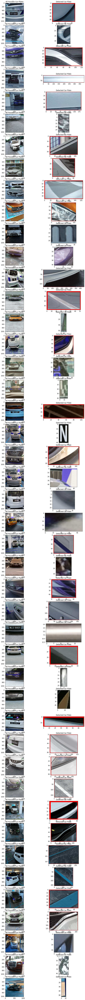

In [20]:
dir = r"C:\Users\Kuah Jia Chen\Documents\Monash_Resources\Sem 1 2023\FIT3081\Assignment 2\Set 1\Set 1 - 45"

fig, axs = plt.subplots(len(os.listdir(dir)), 2, figsize=(12, 3*len(os.listdir(dir))))

for i, pic in enumerate(os.listdir(dir)):
    
    print("now running image {}".format(i+1))
    
    """
    Preprocessing of the image
    
    *   Reading the Image
    *   Rotate the Image
    *   Resize the Image
    *   Converting to grayscale
    *   Percentile point contrast stretching
    *   Median Blur
    *   Bilateral Filter
    *   Edge Detection (Canny)
    *   Binarize the Image
    *   Invert the Image
    *   Morphological Operation
    """
    
    pic_dir = os.path.join(dir,pic)
    
    ori_img = Image.open(pic_dir)
    
    # rotate the image
    ori_img = rotate_img(ori_img)
    
    # resize the image
    ori_img = ori_img.resize((1024,1024))
    
    process_img = ori_img.copy()
    
    # convert the image to gray scale
    gray_img = convert_to_gray_scale(process_img)
    
    # perform contrast stretching 
    gray_img = contrast_stretching(gray_img)
    
    gray_img_arr = np.array(gray_img)
    
    # apply median blur
    gray_img_arr = cv2.medianBlur(gray_img_arr, 5)
    
    # apply bilateral filter
    gray_img_arr = cv2.bilateralFilter(gray_img_arr, 13, 15, 15)
    
    edged_img = canny(gray_img_arr)
    edged_img = cv2.cvtColor(edged_img, cv2.COLOR_BGR2GRAY)
    
    """
    Morphological operation
    """
    # binarize the image
    binr = cv2.threshold(edged_img, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]

    # define the kernel
    kernel = np.ones((3, 3), np.uint8)

    # invert the image
    invert = cv2.bitwise_not(binr)

    # use morph gradient
    morph_gradient = cv2.morphologyEx(invert,
                                      cv2.MORPH_GRADIENT, 
                                      kernel)
    
    
    """
    Car Plate Detection
    
    * Perform binary thresholding to convert the input image into a binary image 
    
    * Detect contours of objects in the image using the cv2.findContours() function
    
    * Sort the contours of the image in descending order and only select the top 30

    * For each contour, calculate its area using the cv2.contourArea() function.

    * Calculate the perimeter of the contour using the cv2.arcLength() function.

    * Approximate the contour shape using the cv2.approxPolyDP() function. 
    
    * Calculate the aspect ratio of the contour using cv2.boundingRect() function to get the width and height
    
    * The aspect ratio is calculated using the formula width / height

    * Check if the approximated contour has 4 vertices. If yes, it means that the contour is a quadrilateral.

    * If the contour is a quadrilateral and its area and aspect ration is within reasonable range 
    
    * We will then calculate the white pixel ratio (i.e, (num of white pixel) / (num of all pixel))) for the current contour
    
    * If the white pixel ratio and area is greater than the previous selected best contour 
    
    * This current contour will then be the best contour
    
    * After processing all possible contours, we will draw out the selected best contour
    
    """

    # Perform binary thresholding
    ret, thresh = cv2.threshold(morph_gradient, 0, 255, cv2.THRESH_BINARY)

    contours, new = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)


    # Sort & draw contours of the image (top 30 contours)

    contours = sorted(contours, key = cv2.contourArea, reverse = True)[:30]

    # stores the license plate contour
    screenCnt = None
    
    """
    Validate and Crop out the most possible number plate
    """
    
    """
    Find the best contour with the highest white pixels ratio comparison and area 
    with 4 corners and reasonable area and aspect ratio
    """

    best_contour = None
    best_area = 0
    ori_img_arr = np.array(ori_img)
    all_rect = np.array(ori_img)
    min_aspect_ratio = 1
    max_aspect_ratio = 7
    best_black_white_ratio = 0

    for contour in contours:
        
        perimeter = cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, 0.02 * perimeter, True)
        
        x,y,w,h = cv2.boundingRect(contour)
        aspect_ratio = float(w)/h
        area = w*h
        
        if len(approx) == 4 and area > 500 and area < 100000 and aspect_ratio > min_aspect_ratio and aspect_ratio < max_aspect_ratio:
            
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(all_rect, (x, y), (x+w, y+h), (0, 255, 0), 2)
            
            # the formula is (white pixel / white pixel + black pixel)
            current_black_white_ratio = np.count_nonzero(morph_gradient[y:y+h, x:x+w]) / (morph_gradient[y:y+h, x:x+w].shape[0] * morph_gradient[y:y+h, x:x+w].shape[1])
            
            if current_black_white_ratio > best_black_white_ratio and area > best_area:
                best_black_white_ratio = current_black_white_ratio
                best_area = area
                best_contour = contour

    # Draw bounding rectangle around the best contour
    if best_contour is not None:
        x, y, w, h = cv2.boundingRect(best_contour)
        cv2.rectangle(ori_img_arr, (x, y), (x+w, y+h), (0, 0, 255), 2)

    # Plot the image with all possible rectangles drawn and image with only one car plate detected
    axs[i, 0].imshow(cv2.cvtColor(all_rect, cv2.COLOR_BGR2RGB))
    axs[i, 0].set_title('All Possible Car Plates')
    axs[i, 1].imshow(cv2.cvtColor(ori_img_arr[y:y+h, x:x+w], cv2.COLOR_BGR2RGB))
    axs[i, 1].set_title('Detected Car Plate')
    
plt.show()

### Dataset 2

now running image 1
now running image 2
now running image 3
now running image 4
now running image 5
now running image 6
now running image 7
now running image 8
now running image 9
now running image 10
now running image 11
now running image 12
now running image 13
now running image 14
now running image 15


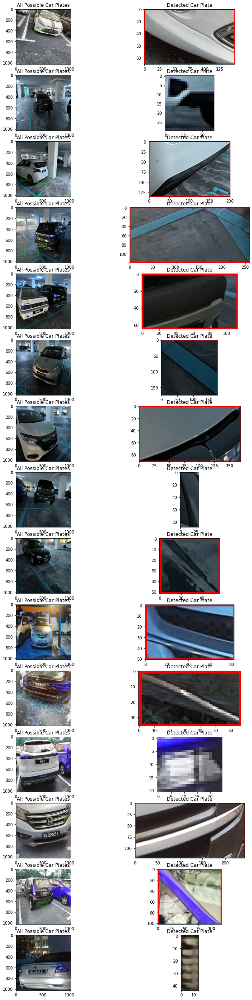

In [21]:
dir = r"C:\Users\Kuah Jia Chen\Documents\Monash_Resources\Sem 1 2023\FIT3081\Assignment 2\Set 2\Set 2 - 15"

fig, axs = plt.subplots(len(os.listdir(dir)), 2, figsize=(12, 3*len(os.listdir(dir))))

for i, pic in enumerate(os.listdir(dir)):
    
    print("now running image {}".format(i+1))
    
    """
    Preprocessing of the image
    
    *   Reading the Image
    *   Rotate the Image
    *   Resize the Image
    *   Converting to grayscale
    *   Percentile point contrast stretching
    *   Median Blur
    *   Bilateral Filter
    *   Edge Detection (Canny)
    *   Binarize the Image
    *   Invert the Image
    *   Morphological Operation
    """
    
    pic_dir = os.path.join(dir,pic)
    
    ori_img = Image.open(pic_dir)
    
    # rotate the image
    ori_img = rotate_img(ori_img)
    
    # resize the image
    ori_img = ori_img.resize((1024,1024))
    
    process_img = ori_img.copy()
    
    # convert the image to gray scale
    gray_img = convert_to_gray_scale(process_img)
    
    # perform contrast stretching 
    gray_img = contrast_stretching(gray_img)
    
    gray_img_arr = np.array(gray_img)
    
    # apply median blur
    gray_img_arr = cv2.medianBlur(gray_img_arr, 5)
    
    # apply bilateral filter
    gray_img_arr = cv2.bilateralFilter(gray_img_arr, 13, 15, 15)
    
    edged_img = canny(gray_img_arr)
    edged_img = cv2.cvtColor(edged_img, cv2.COLOR_BGR2GRAY)
    
    """
    Morphological operation
    """
    # binarize the image
    binr = cv2.threshold(edged_img, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]

    # define the kernel
    kernel = np.ones((3, 3), np.uint8)

    # invert the image
    invert = cv2.bitwise_not(binr)

    # use morph gradient
    morph_gradient = cv2.morphologyEx(invert,
                                      cv2.MORPH_GRADIENT, 
                                      kernel)
    
    
    """
    Find & draw contours of the image (all contours)
    """
    
    # Perform binary thresholding
    ret, thresh = cv2.threshold(morph_gradient, 0, 255, cv2.THRESH_BINARY)

    contours, new = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)


    # Sort & draw contours of the image (top 30 contours)

    contours = sorted(contours, key = cv2.contourArea, reverse = True)[:30]

    # stores the license plate contour
    screenCnt = None
    
    """
    Validate and Crop out the most possible number plate
    """
    
    """
    Find the best contour with the highest white pixels ratio comparison and area 
    with 4 corners and reasonable area and aspect ratio
    """

    best_contour = None
    best_area = 0
    ori_img_arr = np.array(ori_img)
    all_rect = np.array(ori_img)
    min_aspect_ratio = 1
    max_aspect_ratio = 7
    best_black_white_ratio = 0

    for contour in contours:
        
        perimeter = cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, 0.02 * perimeter, True)
        
        x,y,w,h = cv2.boundingRect(contour)
        aspect_ratio = float(w)/h
        area = w*h
        
        if len(approx) == 4 and area > 500 and area < 100000 and aspect_ratio > min_aspect_ratio and aspect_ratio < max_aspect_ratio:
            
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(all_rect, (x, y), (x+w, y+h), (0, 255, 0), 2)
            
            # the formula is (white pixel / white pixel + black pixel)
            current_black_white_ratio = np.count_nonzero(morph_gradient[y:y+h, x:x+w]) / (morph_gradient[y:y+h, x:x+w].shape[0] * morph_gradient[y:y+h, x:x+w].shape[1])
            
            if current_black_white_ratio > best_black_white_ratio and area > best_area:
                best_black_white_ratio = current_black_white_ratio
                best_area = area
                best_contour = contour

    # Draw bounding rectangle around the best contour
    if best_contour is not None:
        x, y, w, h = cv2.boundingRect(best_contour)
        cv2.rectangle(ori_img_arr, (x, y), (x+w, y+h), (0, 0, 255), 2)

    # Plot the image with all possible rectangles drawn and image with only one car plate detected
    axs[i, 0].imshow(cv2.cvtColor(all_rect, cv2.COLOR_BGR2RGB))
    axs[i, 0].set_title('All Possible Car Plates')
    axs[i, 1].imshow(cv2.cvtColor(ori_img_arr[y:y+h, x:x+w], cv2.COLOR_BGR2RGB))
    axs[i, 1].set_title('Detected Car Plate')
    
plt.show()

### Dataset 3

now running image 1
now running image 2
now running image 3
now running image 4
now running image 5
now running image 6
now running image 7
now running image 8
now running image 9
now running image 10


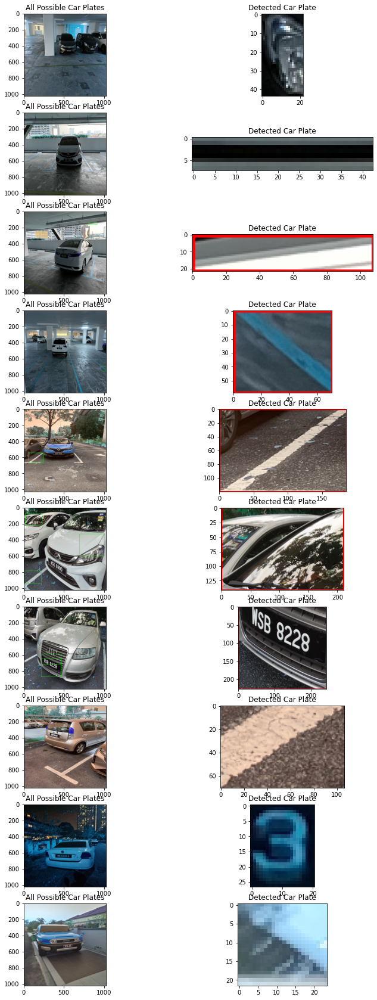

In [22]:
dir = r"C:\Users\Kuah Jia Chen\Documents\Monash_Resources\Sem 1 2023\FIT3081\Assignment 2\Set 3\Set 3 - 10"

fig, axs = plt.subplots(len(os.listdir(dir)), 2, figsize=(12, 3*len(os.listdir(dir))))

for i, pic in enumerate(os.listdir(dir)):
    
    print("now running image {}".format(i+1))
    
    """
    Preprocessing of the image
    
    *   Reading the Image
    *   Rotate the Image
    *   Resize the Image
    *   Converting to grayscale
    *   Percentile point contrast stretching
    *   Median Blur
    *   Bilateral Filter
    *   Edge Detection (Canny)
    *   Binarize the Image
    *   Invert the Image
    *   Morphological Operation
    """
    
    pic_dir = os.path.join(dir,pic)
    
    ori_img = Image.open(pic_dir)
    
    # rotate the image
    ori_img = rotate_img(ori_img)
    
    # resize the image
    ori_img = ori_img.resize((1024,1024))
    
    process_img = ori_img.copy()
    
    # convert the image to gray scale
    gray_img = convert_to_gray_scale(process_img)
    
    # perform contrast stretching 
    gray_img = contrast_stretching(gray_img)
    
    gray_img_arr = np.array(gray_img)
    
    # apply median blur
    gray_img_arr = cv2.medianBlur(gray_img_arr, 5)
    
    # apply bilateral filter
    gray_img_arr = cv2.bilateralFilter(gray_img_arr, 13, 15, 15)
    
    edged_img = canny(gray_img_arr)
    edged_img = cv2.cvtColor(edged_img, cv2.COLOR_BGR2GRAY)
    
    """
    Morphological operation
    """
    # binarize the image
    binr = cv2.threshold(edged_img, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]

    # define the kernel
    kernel = np.ones((3, 3), np.uint8)

    # invert the image
    invert = cv2.bitwise_not(binr)

    # use morph gradient
    morph_gradient = cv2.morphologyEx(invert,
                                      cv2.MORPH_GRADIENT, 
                                      kernel)
    
    
    """
    Find & draw contours of the image (all contours)
    """
    
    # Perform binary thresholding
    ret, thresh = cv2.threshold(morph_gradient, 0, 255, cv2.THRESH_BINARY)

    contours, new = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)


    # Sort & draw contours of the image (top 30 contours)

    contours = sorted(contours, key = cv2.contourArea, reverse = True)[:30]

    # stores the license plate contour
    screenCnt = None
    
    """
    Validate and Crop out the most possible number plate
    """
    
    """
    Find the best contour with the highest white pixels ratio comparison and area 
    with 4 corners and reasonable area and aspect ratio
    """

    best_contour = None
    best_area = 0
    ori_img_arr = np.array(ori_img)
    all_rect = np.array(ori_img)
    min_aspect_ratio = 1
    max_aspect_ratio = 7
    best_black_white_ratio = 0

    for contour in contours:
        
        perimeter = cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, 0.02 * perimeter, True)
        
        x,y,w,h = cv2.boundingRect(contour)
        aspect_ratio = float(w)/h
        area = w*h
        
        if len(approx) == 4 and area > 500 and area < 100000 and aspect_ratio > min_aspect_ratio and aspect_ratio < max_aspect_ratio:
            
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(all_rect, (x, y), (x+w, y+h), (0, 255, 0), 2)
            
            # the formula is (white pixel / white pixel + black pixel)
            current_black_white_ratio = np.count_nonzero(morph_gradient[y:y+h, x:x+w]) / (morph_gradient[y:y+h, x:x+w].shape[0] * morph_gradient[y:y+h, x:x+w].shape[1])
            
            if current_black_white_ratio > best_black_white_ratio and area > best_area:
                best_black_white_ratio = current_black_white_ratio
                best_area = area
                best_contour = contour

    # Draw bounding rectangle around the best contour
    if best_contour is not None:
        x, y, w, h = cv2.boundingRect(best_contour)
        cv2.rectangle(ori_img_arr, (x, y), (x+w, y+h), (0, 0, 255), 2)

    # Plot the image with all possible rectangles drawn and image with only one car plate detected
    axs[i, 0].imshow(cv2.cvtColor(all_rect, cv2.COLOR_BGR2RGB))
    axs[i, 0].set_title('All Possible Car Plates')
    axs[i, 1].imshow(cv2.cvtColor(ori_img_arr[y:y+h, x:x+w], cv2.COLOR_BGR2RGB))
    axs[i, 1].set_title('Detected Car Plate')
    
plt.show()

### Accuracy table

| Dataset | Number of Image | Accuracy |
| --- | --- | --- |
| 1 | 45 | 0/45 |
| 2 | 15 | 0/15 |
| 3 | 10 | 1/10 |

# Section 3.2: Car License Plate Detection Using Built-in Canny Edge Detection Algorithm

### Dataset 1

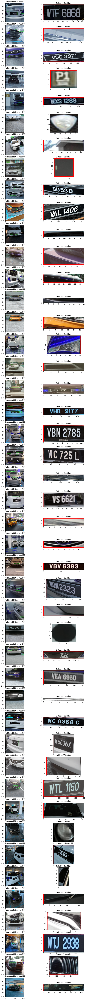

In [23]:
dir = r"C:\Users\Kuah Jia Chen\Documents\Monash_Resources\Sem 1 2023\FIT3081\Assignment 2\Set 1\Set 1 - 45"

fig, axs = plt.subplots(len(os.listdir(dir)), 2, figsize=(12, 3*len(os.listdir(dir))))

for i, pic in enumerate(os.listdir(dir)):
    
    pic_dir = os.path.join(dir,pic)
    
    """
    Preprocessing of the image
    
    *   Reading the Image
    *   Rotate the Image
    *   Resize the Image
    *   Converting to grayscale
    *   Percentile point contrast stretching
    *   Median Blur
    *   Bilateral Filter
    *   Edge Detection (Canny)
    *   Binarize the Image
    *   Invert the Image
    *   Morphological Operation
    """
    
    ori_img = Image.open(pic_dir)
    
    # rotate the image
    ori_img = rotate_img(ori_img)
    
    # resize the image
    width, height = 1024, 1024
    ori_img = ori_img.resize((width,height))
    
    process_img = ori_img.copy()
    
    # convert the image to gray scale
    gray_img = convert_to_gray_scale(process_img)
    
    # perform contrast stretching
    gray_img = contrast_stretching(gray_img)

    gray_img_arr = np.array(gray_img)
    
    # apply median blue
    kernel_size = 5
    gray_img_arr = cv2.medianBlur(gray_img_arr, kernel_size)
    
    # apply bilateral filter
    d, sigma_color, sigma_space = 15, 20, 20
    gray_img_arr = cv2.bilateralFilter(gray_img_arr, d, sigma_color, sigma_space)
    
    # apply Canny operator
    low_threshold, high_threshold = 60, 200
    edged_img = cv2.Canny(gray_img_arr, low_threshold, high_threshold)

    """
    Morphological operation
    """
    
    # binarize the image
    threshold_value, max_value = 0, 255
    binr = cv2.threshold(edged_img, threshold_value, max_value, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]

    # define the kernel
    morph_kernel_size = (3,3)
    kernel = np.ones(morph_kernel_size, np.uint8)

    # invert the image
    invert = cv2.bitwise_not(binr)

    # use morph gradient
    morph_gradient = cv2.morphologyEx(invert,
                                      cv2.MORPH_GRADIENT, 
                                      kernel)
    
    """
    Find & draw contours of the image (all contours)
    """
    # Perform binary thresholding
    ret, thresh = cv2.threshold(morph_gradient, threshold_value, max_value, cv2.THRESH_BINARY)

    contours, new = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

    """
    Sort & draw contours of the image (top 30 contours)
    """
    contours = sorted(contours, key = cv2.contourArea, reverse = True)[:30]

    # stores the license plate contour
    screenCnt = None

    """
    Validate and Crop out the most possible number plate
    """
    
    """
    Find the best contour with the highest white pixels ratio comparison and area 
    with 4 corners and reasonable area and aspect ratio
    """

    best_contour = None
    best_area = 0
    ori_img_arr = np.array(ori_img)
    all_rect = np.array(ori_img)
    min_aspect_ratio = 1
    max_aspect_ratio = 7
    best_black_white_ratio = 0


    for contour in contours:
        
        perimeter = cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, 0.02 * perimeter, True)
        
        x,y,w,h = cv2.boundingRect(contour)
        aspect_ratio = float(w)/h
        area = w*h
        
        if len(approx) == 4 and area > 500 and area < 140000 and aspect_ratio > min_aspect_ratio and aspect_ratio < max_aspect_ratio:
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(all_rect, (x, y), (x+w, y+h), (0, 255, 0), 2)
            
            # the formula is (white pixel / white pixel + black pixel)
            current_black_white_ratio = np.count_nonzero(morph_gradient[y:y+h, x:x+w]) / (morph_gradient[y:y+h, x:x+w].shape[0] * morph_gradient[y:y+h, x:x+w].shape[1])
            
            if current_black_white_ratio > best_black_white_ratio and area > best_area:
                best_black_white_ratio = current_black_white_ratio
                best_area = area
                best_contour = contour

    # Draw bounding rectangle around the best contour
    if best_contour is not None:
        x, y, w, h = cv2.boundingRect(best_contour)
        cv2.rectangle(ori_img_arr, (x, y), (x+w, y+h), (0, 0, 255), 2)

    # Plot the image with all possible rectangles drawn and image with only one car plate detected
    axs[i, 0].imshow(cv2.cvtColor(all_rect, cv2.COLOR_BGR2RGB))
    axs[i, 0].set_title('All Possible Car Plates')
    axs[i, 1].imshow(cv2.cvtColor(ori_img_arr[y:y+h, x:x+w], cv2.COLOR_BGR2RGB))
    axs[i, 1].set_title('Detected Car Plate')
    
plt.show()

### Dataset 2

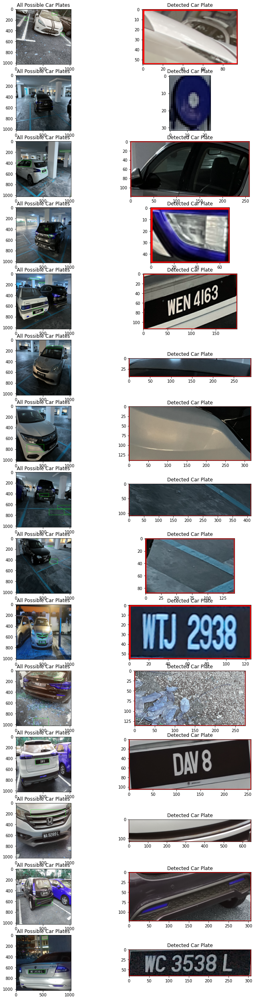

In [24]:
dir = r"C:\Users\Kuah Jia Chen\Documents\Monash_Resources\Sem 1 2023\FIT3081\Assignment 2\Set 2\Set 2 - 15"

fig, axs = plt.subplots(len(os.listdir(dir)), 2, figsize=(12, 3*len(os.listdir(dir))))

for i, pic in enumerate(os.listdir(dir)):
    
    pic_dir = os.path.join(dir,pic)
    
    """
    Preprocessing of the image
    
    *   Reading the Image
    *   Rotate the Image
    *   Resize the Image
    *   Converting to grayscale
    *   Percentile point contrast stretching
    *   Median Blur
    *   Bilateral Filter
    *   Edge Detection (Canny)
    *   Binarize the Image
    *   Invert the Image
    *   Morphological Operation
    """
    
    ori_img = Image.open(pic_dir)
    
    # rotate the image
    ori_img = rotate_img(ori_img)
    
    # resize the image
    width, height = 1024, 1024
    ori_img = ori_img.resize((width,height))
    
    process_img = ori_img.copy()
    
    # convert the image to gray scale
    gray_img = convert_to_gray_scale(process_img)
    
    # perform contrast stretching
    gray_img = contrast_stretching(gray_img)

    gray_img_arr = np.array(gray_img)
    
    # apply median blue
    kernel_size = 5
    gray_img_arr = cv2.medianBlur(gray_img_arr, kernel_size)
    
    # apply bilateral filter
    d, sigma_color, sigma_space = 15, 20, 20
    gray_img_arr = cv2.bilateralFilter(gray_img_arr, d, sigma_color, sigma_space)
    
    # apply Canny operator
    low_threshold, high_threshold = 60, 200
    edged_img = cv2.Canny(gray_img_arr, low_threshold, high_threshold)

    """
    Morphological operation
    """
    
    # binarize the image
    threshold_value, max_value = 0, 255
    binr = cv2.threshold(edged_img, threshold_value, max_value, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]

    # define the kernel
    morph_kernel_size = (3,3)
    kernel = np.ones(morph_kernel_size, np.uint8)

    # invert the image
    invert = cv2.bitwise_not(binr)

    # use morph gradient
    morph_gradient = cv2.morphologyEx(invert,
                                      cv2.MORPH_GRADIENT, 
                                      kernel)
    
    """
    Find & draw contours of the image (all contours)
    """
    # Perform binary thresholding
    ret, thresh = cv2.threshold(morph_gradient, threshold_value, max_value, cv2.THRESH_BINARY)

    contours, new = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

    """
    Sort & draw contours of the image (top 30 contours)
    """
    contours = sorted(contours, key = cv2.contourArea, reverse = True)[:30]

    # stores the license plate contour
    screenCnt = None

    """
    Validate and Crop out the most possible number plate
    """
    
    """
    Find the best contour with the highest white pixels ratio comparison and area 
    with 4 corners and reasonable area and aspect ratio
    """

    best_contour = None
    best_area = 0
    ori_img_arr = np.array(ori_img)
    all_rect = np.array(ori_img)
    min_aspect_ratio = 1
    max_aspect_ratio = 7
    best_black_white_ratio = 0


    for contour in contours:
    
        perimeter = cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, 0.02 * perimeter, True)
        
        x,y,w,h = cv2.boundingRect(contour)
        aspect_ratio = float(w)/h
        area = w*h
        
        if len(approx) == 4 and area > 500 and area < 80000 and aspect_ratio > min_aspect_ratio and aspect_ratio < max_aspect_ratio:

            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(all_rect, (x, y), (x+w, y+h), (0, 255, 0), 2)
            
            # the formula is (white pixel / white pixel + black pixel)
            current_black_white_ratio = np.count_nonzero(morph_gradient[y:y+h, x:x+w]) / (morph_gradient[y:y+h, x:x+w].shape[0] * morph_gradient[y:y+h, x:x+w].shape[1])
            
            if current_black_white_ratio > best_black_white_ratio and area > best_area:
                best_black_white_ratio = current_black_white_ratio
                best_area = area
                best_contour = contour

    # Draw bounding rectangle around the best contour
    if best_contour is not None:
        x, y, w, h = cv2.boundingRect(best_contour)
        cv2.rectangle(ori_img_arr, (x, y), (x+w, y+h), (0, 0, 255), 2)

    # Plot the image with all possible rectangles drawn and image with only one car plate detected
    axs[i, 0].imshow(cv2.cvtColor(all_rect, cv2.COLOR_BGR2RGB))
    axs[i, 0].set_title('All Possible Car Plates')
    axs[i, 1].imshow(cv2.cvtColor(ori_img_arr[y:y+h, x:x+w], cv2.COLOR_BGR2RGB))
    axs[i, 1].set_title('Detected Car Plate')
    
plt.show()

### Dataset 3

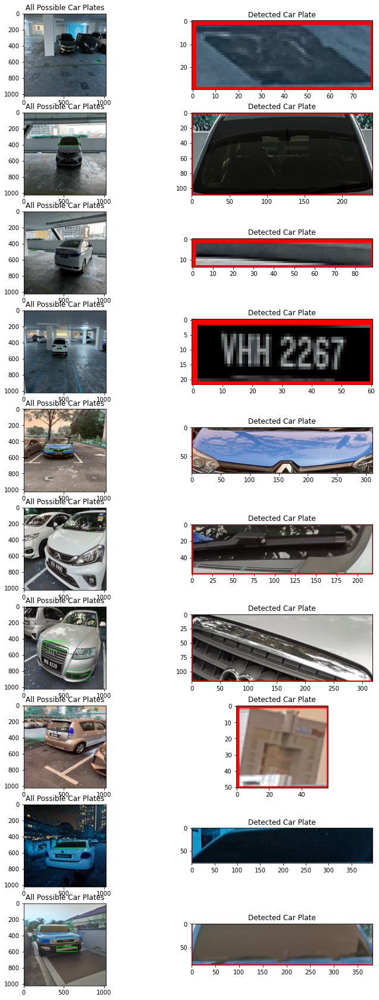

In [25]:
dir = r"C:\Users\Kuah Jia Chen\Documents\Monash_Resources\Sem 1 2023\FIT3081\Assignment 2\Set 3\Set 3 - 10"

fig, axs = plt.subplots(len(os.listdir(dir)), 2, figsize=(12, 3*len(os.listdir(dir))))

for i, pic in enumerate(os.listdir(dir)):
    
    pic_dir = os.path.join(dir,pic)
    
    """
    Preprocessing of the image
    
    *   Reading the Image
    *   Rotate the Image
    *   Resize the Image
    *   Converting to grayscale
    *   Percentile point contrast stretching
    *   Median Blur
    *   Bilateral Filter
    *   Edge Detection (Canny)
    *   Binarize the Image
    *   Invert the Image
    *   Morphological Operation
    """
    
    ori_img = Image.open(pic_dir)
    
    # rotate the image
    ori_img = rotate_img(ori_img)
    
    # resize the image
    width, height = 1024, 1024
    ori_img = ori_img.resize((width,height))
    
    process_img = ori_img.copy()
    
    # convert the image to gray scale
    gray_img = convert_to_gray_scale(process_img)
    
    # perform contrast stretching
    gray_img = contrast_stretching(gray_img)

    gray_img_arr = np.array(gray_img)
    
    # apply median blue
    kernel_size = 5
    gray_img_arr = cv2.medianBlur(gray_img_arr, kernel_size)
    
    # apply bilateral filter
    d, sigma_color, sigma_space = 15, 20, 20
    gray_img_arr = cv2.bilateralFilter(gray_img_arr, d, sigma_color, sigma_space)
    
    # apply Canny operator
    low_threshold, high_threshold = 60, 200
    edged_img = cv2.Canny(gray_img_arr, low_threshold, high_threshold)

    """
    Morphological operation
    """
    
    # binarize the image
    threshold_value, max_value = 0, 255
    binr = cv2.threshold(edged_img, threshold_value, max_value, cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]

    # define the kernel
    morph_kernel_size = (3,3)
    kernel = np.ones(morph_kernel_size, np.uint8)

    # invert the image
    invert = cv2.bitwise_not(binr)

    # use morph gradient
    morph_gradient = cv2.morphologyEx(invert,
                                      cv2.MORPH_GRADIENT, 
                                      kernel)
    
    """
    Find & draw contours of the image (all contours)
    """
    # Perform binary thresholding
    ret, thresh = cv2.threshold(morph_gradient, threshold_value, max_value, cv2.THRESH_BINARY)

    contours, new = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

    """
    Sort & draw contours of the image (top 30 contours)
    """
    contours = sorted(contours, key = cv2.contourArea, reverse = True)[:30]

    # stores the license plate contour
    screenCnt = None


    """
    Validate and Crop out the most possible number plate
    """
    
    """
    Find the best contour with the highest white pixels ratio comparison and area 
    with 4 corners and reasonable area and aspect ratio
    """

    best_contour = None
    best_area = 0
    ori_img_arr = np.array(ori_img)
    all_rect = np.array(ori_img)
    min_aspect_ratio = 1
    max_aspect_ratio = 7
    best_black_white_ratio = 0


    for contour in contours:
        
        perimeter = cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, 0.02 * perimeter, True)
        
        x,y,w,h = cv2.boundingRect(contour)
        aspect_ratio = float(w)/h
        area = w*h
        
        if len(approx) == 4 and area > 500 and area < 140000 and aspect_ratio > min_aspect_ratio and aspect_ratio < max_aspect_ratio:

            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(all_rect, (x, y), (x+w, y+h), (0, 255, 0), 2)
            
            # the formula is (white pixel / white pixel + black pixel)
            current_black_white_ratio = np.count_nonzero(morph_gradient[y:y+h, x:x+w]) / (morph_gradient[y:y+h, x:x+w].shape[0] * morph_gradient[y:y+h, x:x+w].shape[1])
            
            if current_black_white_ratio > best_black_white_ratio and area > best_area:
                best_black_white_ratio = current_black_white_ratio
                best_area = area
                best_contour = contour

    # Draw bounding rectangle around the best contour
    if best_contour is not None:
        x, y, w, h = cv2.boundingRect(best_contour)
        cv2.rectangle(ori_img_arr, (x, y), (x+w, y+h), (0, 0, 255), 2)

    # Plot the image with all possible rectangles drawn and image with only one car plate detected
    axs[i, 0].imshow(cv2.cvtColor(all_rect, cv2.COLOR_BGR2RGB))
    axs[i, 0].set_title('All Possible Car Plates')
    axs[i, 1].imshow(cv2.cvtColor(ori_img_arr[y:y+h, x:x+w], cv2.COLOR_BGR2RGB))
    axs[i, 1].set_title('Detected Car Plate')
    
plt.show()

### Accuracy table

| Dataset | Number of Image | Accuracy |
| --- | --- | --- |
| 1 | 45 | 19/45 |
| 2 | 15 | 4/15 |
| 3 | 10 | 1/10 |

# Conclusion

This Jupyter Notebook includes two subsections demonstrating different approaches to car license plate detection. The first subsection utilized a customized Canny edge detection algorithm, but the results were not satisfactory, with poor accuracy and reliability. In contrast, the second subsection used the built-in Canny edge detection algorithm and produced the most accurate and reliable implementation. We have chosen this second approach as our final implementation and recommend the marker to focus on its performance. Although both approaches are included in the notebook for illustration purposes, we hope that the marker disregard the performance of the first subsection. Overall, the implemented algorithms demonstrated the importance of choosing the appropriate edge detection method for car license plate detection.